In [145]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import scipy.io
from scipy.interpolate import interp1d
import lmfit as lm
import scipy.cluster.hierarchy as ch

In [146]:
egfp=scipy.io.loadmat('egfp.mat')
egfp0=egfp['egfp'][0][0].T
egfp1=egfp['egfp'][0][1].T
egfp2=egfp['egfp'][0][2].T
egfp3=egfp['egfp'][0][3].T
egfp4=egfp['egfp'][0][4].T
egfp5=egfp['egfp'][0][5].T
print(egfp0.shape)
print(egfp1.shape)
egfp_lipo=np.vstack((egfp0,egfp1))
#print(egfp_lipo[0])

(69, 87)
(375, 87)


In [147]:
def twostage(t,t0,ktl,delta,beta):
    km=np.abs(ktl)
    delta=np.abs(delta)
    beta=np.abs(beta)
    t0=np.abs(t0)
    return (ktl/(delta-beta)*(1-np.exp(-(delta-beta)*(t-t0)))*np.exp(-beta*(t-t0))).clip(0)
twostage_model = lm.Model(twostage)

In [148]:
def threestage(t,t0,ktl,km,delta,beta):
    km=np.abs(km)
    ktl=np.abs(ktl)
    delta=np.abs(delta)
    beta=np.abs(beta)
    dmb = delta-beta
    bkm = beta + km
    dmbk = delta-bkm
    t0=np.abs(t0)
    dt=t-t0
    result = 1/dmb +km*np.exp(-dmb*dt)/dmb/dmbk-np.exp(-km*dt)/dmbk
    result = ktl*np.exp(-beta*dt)*result.clip(0)
    result[t<t0]=0
    return result
threestage_model = lm.Model(threestage)

[[Model]]
    Model(twostage)
[[Fit Statistics]]
    # function evals   = 75
    # data points      = 87
    # variables        = 4
    chi-square         = 3606.041
    reduced chi-square = 43.446
    Akaike info crit   = 336.123
    Bayesian info crit = 345.986
[[Variables]]
    t0:      2.35701692 +/- 0.072203 (3.06%) (init= 7)
    ktl:     1104.14403 +/- 51.79020 (4.69%) (init= 800)
    delta:  -0.05115990 +/- 7.819862 (15285.14%) (init= 0.07)
    beta:    0.05121027 +/- 7.822525 (15275.30%) (init= 0.05)
[[Correlations]] (unreported correlations are <  0.100)
    C(delta, beta)               =  1.000 
    C(t0, ktl)                   =  0.728 
    C(ktl, beta)                 =  0.189 
    C(ktl, delta)                =  0.188 

[[Model]]
    Model(threestage)
[[Fit Statistics]]
    # function evals   = 11671
    # data points      = 87
    # variables        = 5
    chi-square         = 1467.114
    reduced chi-square = 17.892
    Akaike info crit   = 260.937
    Bayesian info cri

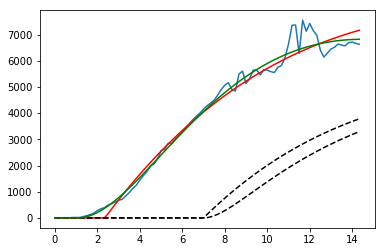

In [149]:
data = egfp_lipo[0]
sigma = np.sqrt(data)
time = np.arange(0,data.size)*10/60
result2 = twostage_model.fit(data, t=time, t0=7, ktl=800, delta=0.07, beta=0.05, weights=1/sigma)
result3 = threestage_model.fit(data, t=time, t0=7, ktl=800, km=1,delta=0.07, beta=0.05, weights=1/sigma)
plt.figure()
plt.plot(time,data)
plt.plot(time,result2.init_fit, 'k--')
plt.plot(time, result2.best_fit, 'r-')
plt.plot(time,result3.init_fit, 'k--')
plt.plot(time, result3.best_fit, 'g-')
plt.ylim((-0.05*data.max(),data.max()*1.05))
print(result2.fit_report())
print(result3.fit_report())

In [150]:
# cluster analysis to find the onset for fluorescence
# normalize the data
time_norm=(time-time.min())/50/(time.max()-time.min())
t0cluster_list=[]
for data in egfp_lipo:
    data_norm=(data-data.min())/(data.max()-data.min())
    data_diff_norm=np.gradient(data_norm)
    # combine the data
    X = np.vstack((time_norm,data_norm,data_diff_norm)).T
    # generate the linkage matrix
    Z = ch.linkage(X, method='single',metric='cityblock')
    tree = ch.cut_tree(Z, height=0.003).flatten()
    t0cluster_list.append(tree[tree==0].size)
t0cluster_list=np.array(t0cluster_list)
# convert to hours
t0cluster_list=(t0cluster_list)*10/60

/Users/hstrey/anaconda/envs/python3/lib/python3.5/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


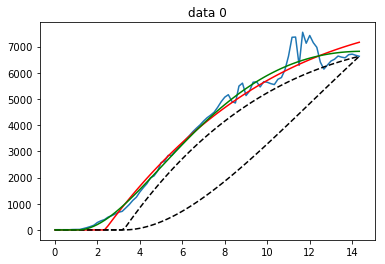

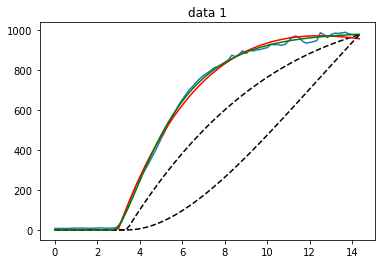

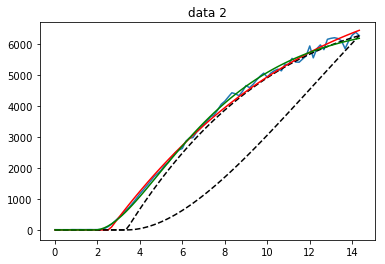

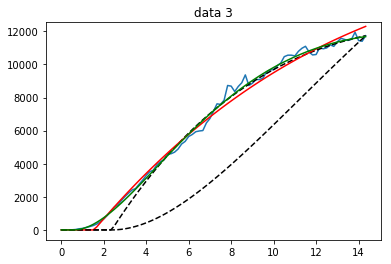

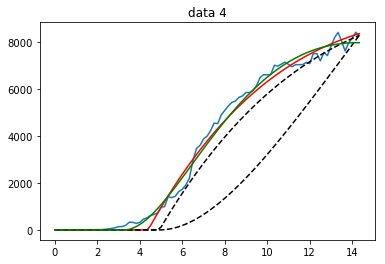

...

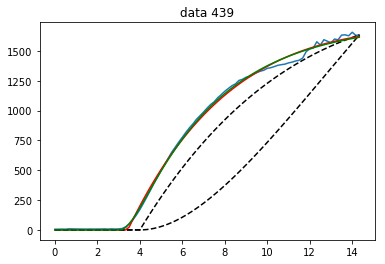

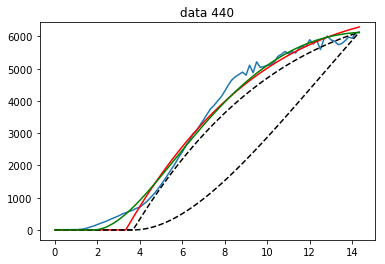

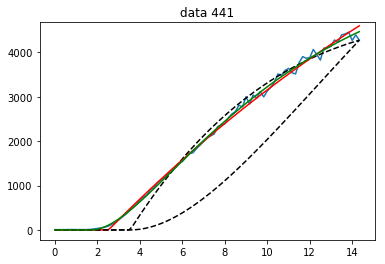

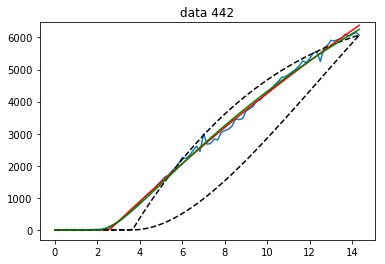

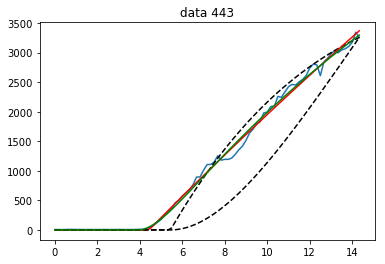

In [151]:
# two stage model
t0_list=[]
ktl_list=[]
delta_list=[]
beta_list=[]
t0_std_list=[]
ktl_std_list=[]
delta_std_list=[]
beta_std_list=[]
red_chi2_list=[]

# three stage model
t0_list3=[]
ktl_list3=[]
km_list3=[]
delta_list3=[]
beta_list3=[]
t0_std_list3=[]
ktl_std_list3=[]
km_std_list3=[]
delta_std_list3=[]
beta_std_list3=[]
red_chi2_list3=[]

for data,t0guess,i in zip(egfp_lipo,t0cluster_list,range(t0cluster_list.size)):
    sigma = np.sqrt(data)
    time = np.arange(0,data.size)*10/60
    # lets estimate the parameters
    # to estimate t0 we take I_max-I_min and estimate t for which I=I_min+0.1(I_max-Imin)
    # this can be done by interpolation.  The advantage is that the guess for t0 is greater
    # than the actual value - fits seems to converge better
    delta_I=data.max()-data.min()
    t0guess = interp1d(data,time)(data.min()+0.1*delta_I)
    delta_t=time[-1]-t0guess
    
    two=twostage(np.array([delta_t]),0,1,0.07,0.05)
    ktl2=data[-1]/two[0]
    
    three=threestage(np.array([delta_t]),0,1,0.03,0.07,0.05)
    ktl3=data[-1]/three[0]
    
    result2 = twostage_model.fit(data, t=time, t0=t0guess, ktl=ktl2, delta=0.07, beta=0.05, weights=1/sigma)
    result3 = threestage_model.fit(data, t=time, t0=t0guess, ktl=ktl3, km=0.03,delta=0.07, beta=0.05, weights=1/sigma)

    plt.figure()
    plt.title("data "+str(i))
    plt.plot(time,data)
    plt.plot(time,result2.init_fit, 'k--')
    plt.plot(time, result2.best_fit, 'r-')
    plt.plot(time,result3.init_fit, 'k--')
    plt.plot(time, result3.best_fit, 'g-')
    plt.ylim((-0.05*data.max(),data.max()*1.05))
    
    if result2:
        t0_list.append(np.abs(result2.values['t0']))
        ktl_list.append(np.abs(result2.values['ktl']))
        delta_list.append(np.abs(result2.values['delta']))
        beta_list.append(np.abs(result2.values['beta']))
        red_chi2_list.append(result2.redchi)

        t0_std_list.append(result2.covar[0][0])
        ktl_std_list.append(result2.covar[1][1])
        delta_std_list.append(result2.covar[2][2])
        beta_std_list.append(result2.covar[3][3])
    
    if result3:
        t0_list3.append(np.abs(result3.values['t0']))
        ktl_list3.append(np.abs(result3.values['ktl']))
        km_list3.append(np.abs(result3.values['km']))
        delta_list3.append(np.abs(result3.values['delta']))
        beta_list3.append(np.abs(result3.values['beta']))
        red_chi2_list3.append(result3.redchi)

        t0_std_list3.append(result3.covar[0][0])
        ktl_std_list3.append(result3.covar[1][1])
        km_std_list3.append(result3.covar[2][2])
        delta_std_list3.append(result3.covar[3][3])
        beta_std_list3.append(result3.covar[4][4])
    
t0_list=np.array(t0_list)
ktl_list=np.array(ktl_list)
delta_list=np.array(delta_list)
beta_list=np.array(beta_list)
t0_std_list=np.array(t0_std_list)
ktl_std_list=np.array(ktl_std_list)
delta_std_list=np.array(delta_std_list)
beta_std_list=np.array(beta_std_list)

t0_list3=np.array(t0_list3)
ktl_list3=np.array(ktl_list3)
km_list3=np.array(km_list3)
delta_list3=np.array(delta_list3)
beta_list3=np.array(beta_list3)
t0_std_list3=np.array(t0_std_list3)
ktl_std_list3=np.array(ktl_std_list3)
km_std_list3=np.array(km_std_list3)
delta_std_list3=np.array(delta_std_list3)
beta_std_list3=np.array(beta_std_list3)

red_chi2_list=np.array(red_chi2_list)
red_chi2_list3=np.array(red_chi2_list3)


14.8223369279 8.0840775185
14.5360454077 8.49658525775
[ 59.34610967  44.38843265  19.84786496   9.93976945   5.06178757
   1.51234899]
[ 34.39500468  26.85670717   9.82397772   5.2687515    2.41746247
   1.17669522]


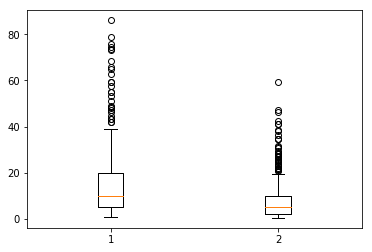

In [152]:
plt.boxplot([red_chi2_list,red_chi2_list3])
print(red_chi2_list.mean(),red_chi2_list3.mean())
print(red_chi2_list.std(),red_chi2_list3.std())
print(np.percentile(red_chi2_list,[97.5,95,75,50,25,2.5]))
print(np.percentile(red_chi2_list3,[97.5,95,75,50,25,2.5]))

In [153]:
print(np.argmax(red_chi2_list),red_chi2_list.max())
print(np.argmax(red_chi2_list3),red_chi2_list3.max())

322 86.0467180228
98 59.3954104684


In [154]:
# cleaning up the data by setting a threshold for redchi2
threshold2 = 100
threshold3 = 100
ktl_list_clean=ktl_list[red_chi2_list<threshold2]
delta_list_clean=delta_list[red_chi2_list<threshold2]
beta_list_clean=beta_list[red_chi2_list<threshold2]
t0_list_clean=t0_list[red_chi2_list<threshold2]
ktl_std_list_clean=ktl_std_list[red_chi2_list<threshold2]
delta_std_list_clean=delta_std_list[red_chi2_list<threshold2]
beta_std_list_clean=beta_std_list[red_chi2_list<threshold2]
t0_std_list_clean=t0_std_list[red_chi2_list<threshold2]

ktl_list3_clean=ktl_list3[red_chi2_list3<threshold3]
km_list3_clean=km_list3[red_chi2_list3<threshold3]
delta_list3_clean=delta_list3[red_chi2_list3<threshold3]
beta_list3_clean=beta_list3[red_chi2_list3<threshold3]
t0_list3_clean=t0_list3[red_chi2_list3<threshold3]
km_std_list3_clean=km_std_list3[red_chi2_list3<threshold3]
ktl_std_list3_clean=ktl_std_list3[red_chi2_list3<threshold3]
delta_std_list3_clean=delta_std_list3[red_chi2_list3<threshold3]
beta_std_list3_clean=beta_std_list3[red_chi2_list3<threshold3]
t0_std_list3_clean=t0_std_list3[red_chi2_list3<threshold3]


In [155]:
print(ktl_list.size,ktl_list_clean.size)
print(ktl_list3.size,ktl_list3_clean.size)

444 444
444 444


533.563952029 15006.7374922


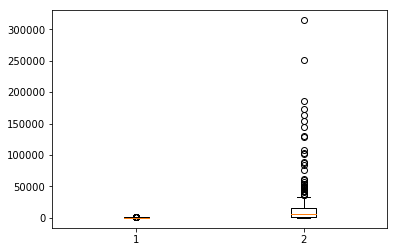

In [156]:
plt.boxplot([ktl_list_clean,ktl_list3_clean])
print(ktl_list_clean.mean(),ktl_list3_clean.mean())

(array([ 406.,   22.,    4.,    3.,    4.,    3.,    0.,    1.,    0.,    1.]),
 array([  4.02102039e+01,   3.14684731e+04,   6.28967359e+04,
          9.43249988e+04,   1.25753262e+05,   1.57181524e+05,
          1.88609787e+05,   2.20038050e+05,   2.51466313e+05,
          2.82894576e+05,   3.14322839e+05]),
 <a list of 10 Patch objects>)

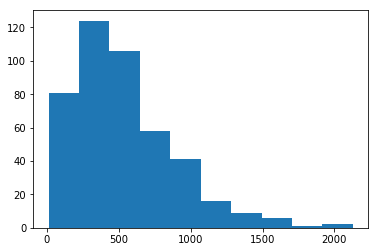

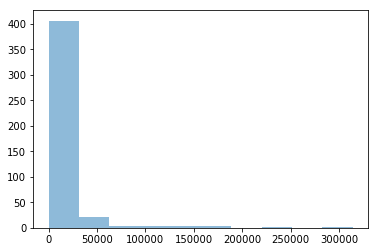

In [157]:
plt.figure()
plt.hist(ktl_list_clean)
plt.figure()
plt.hist(ktl_list3_clean,alpha=0.5)

(array([ 312.,   46.,   32.,   26.,   13.,    8.,    2.,    1.,    2.,    2.]),
 array([ 0.00247875,  0.12090905,  0.23933935,  0.35776965,  0.47619995,
         0.59463025,  0.71306055,  0.83149085,  0.94992115,  1.06835145,
         1.18678175]),
 <a list of 10 Patch objects>)

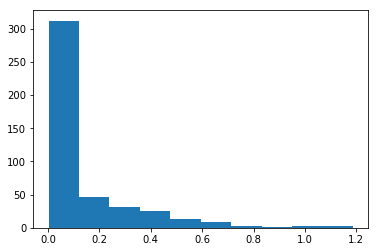

In [158]:
plt.figure()
plt.hist(km_list3_clean)

{'boxes': [<matplotlib.lines.Line2D at 0x112630400>,
 'caps': [<matplotlib.lines.Line2D at 0x11ee7de48>,
 'fliers': [<matplotlib.lines.Line2D at 0x11a220be0>,
 'means': [],
 'medians': [<matplotlib.lines.Line2D at 0x11a220860>,
 'whiskers': [<matplotlib.lines.Line2D at 0x112630a90>,
  <matplotlib.lines.Line2D at 0x119923b00>]}

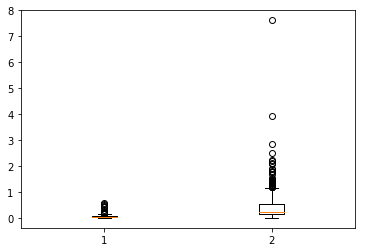

In [159]:
plt.boxplot([delta_list_clean,delta_list3_clean])

0.0629403739254 0.431776934209


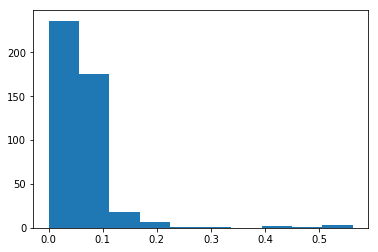

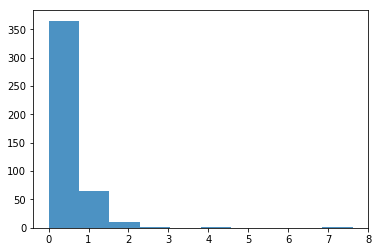

In [160]:
plt.figure()
plt.hist(delta_list_clean)
plt.figure()
plt.hist(delta_list3_clean,alpha=0.8)
print(delta_list_clean.mean(),delta_list3_clean.mean())

{'boxes': [<matplotlib.lines.Line2D at 0x11616de48>,
 'caps': [<matplotlib.lines.Line2D at 0x13bfa6f60>,
 'fliers': [<matplotlib.lines.Line2D at 0x11854a630>,
 'means': [],
 'medians': [<matplotlib.lines.Line2D at 0x11613f2b0>,
 'whiskers': [<matplotlib.lines.Line2D at 0x11616dc88>,
  <matplotlib.lines.Line2D at 0x13d2e08d0>]}

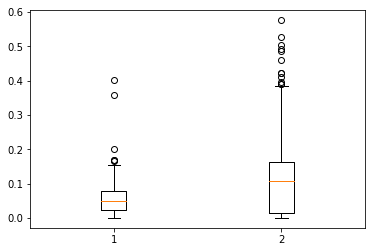

In [161]:
plt.boxplot([beta_list_clean,beta_list3_clean])

(array([ 172.,   60.,  112.,   42.,   28.,   12.,    9.,    4.,    3.,    2.]),
 array([  2.95540338e-09,   5.76366741e-02,   1.15273345e-01,
          1.72910016e-01,   2.30546688e-01,   2.88183359e-01,
          3.45820030e-01,   4.03456701e-01,   4.61093372e-01,
          5.18730043e-01,   5.76366715e-01]),
 <a list of 10 Patch objects>)

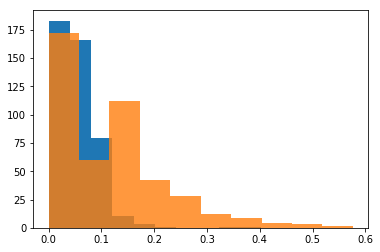

In [162]:
plt.hist(beta_list_clean)
plt.hist(beta_list3_clean,alpha=0.8)

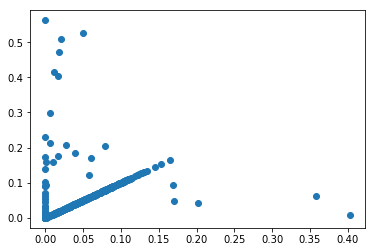

In [163]:
plt.plot(beta_list_clean,delta_list_clean,"o")

{'boxes': [<matplotlib.lines.Line2D at 0x12e4b2320>],
 'caps': [<matplotlib.lines.Line2D at 0x11321f8d0>,
 'fliers': [<matplotlib.lines.Line2D at 0x1183c3f28>],
 'means': [],
 'medians': [<matplotlib.lines.Line2D at 0x1183c3cf8>],
 'whiskers': [<matplotlib.lines.Line2D at 0x12e47ce10>,
  <matplotlib.lines.Line2D at 0x12e47c9e8>]}

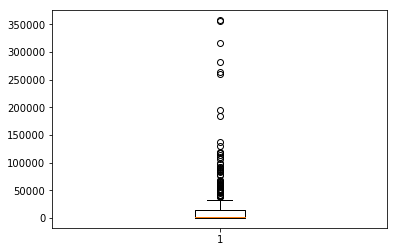

In [164]:
error_delta = delta_std_list_clean/delta_list_clean
plt.boxplot(error_delta)

{'boxes': [<matplotlib.lines.Line2D at 0x11d4a8898>,
 'caps': [<matplotlib.lines.Line2D at 0x136a03f98>,
 'fliers': [<matplotlib.lines.Line2D at 0x12efe7860>,
 'means': [],
 'medians': [<matplotlib.lines.Line2D at 0x11d4ba4a8>,
 'whiskers': [<matplotlib.lines.Line2D at 0x11d4a87b8>,
  <matplotlib.lines.Line2D at 0x121738e10>]}

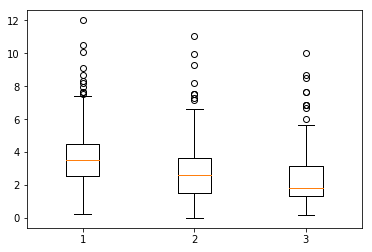

In [165]:
plt.boxplot([t0_list_clean,t0_list3_clean,t0cluster_list])

3.619818057
2.74863967105
2.30893393393


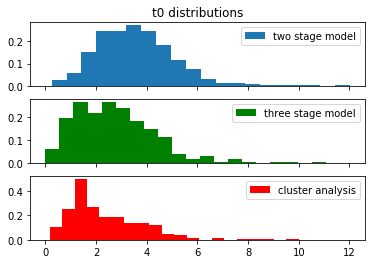

In [166]:
plt.figure()
# Two subplots, the axes array is 1-d
f, axarr = plt.subplots(3, sharex=True)
axarr[0].hist(t0_list_clean, bins=20,normed=True,label='two stage model')
axarr[0].set_title('t0 distributions')
axarr[0].legend()
axarr[1].hist(t0_list3_clean,bins=20,color='g',normed=True,label='three stage model')
axarr[1].legend()
axarr[2].hist(t0cluster_list,bins=20,color='r',normed=True,label='cluster analysis')
axarr[2].legend()
print(t0_list_clean.mean())
print(t0_list3_clean.mean())
print(t0cluster_list.mean())

In [172]:
# save data
np.save("lipo_t0_two",t0_list_clean)
np.save("lipo_t0_three",t0_list3_clean)
np.save("lipo_t0_cluster",t0cluster_list)

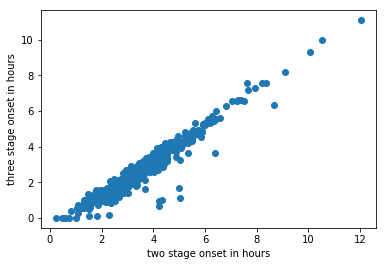

In [170]:
plt.plot(t0_list_clean,t0_list3_clean,"o")
plt.xlabel("two stage onset in hours")
plt.ylabel("three stage onset in hours")